# Customer Segmentation
## Preparing Data for Customer Segmentation

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from datetime import datetime, timezone

from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score

import pickle

In [97]:
df = pd.read_csv('../data/cleaned/customer_information.csv')

In [98]:
df.head()

,user_id,registration_date,age,gender,city,country,first_order_date,last_order_date,total_orders,avg_order_items,...,avg_order_value,avg_days_between_orders,order_frequency_per_year,days_since_first_order,days_since_last_order,days_since_registration,days_until_first_order,age_class,registration_year,registration_month
0,18,2020-06-18 10:15:00+00:00,31,M,Schwedt/Oder,Poland,2021-05-26 10:15:00+00:00,2021-05-26 10:15:00+00:00,1,1.0,...,46.990002,0.0,3.922828e-16,948.572917,948.572917,1290.572917,342.0,31-40,2020,6
1,29,2023-09-22 07:18:00+00:00,23,M,Pudsey,United Kingdom,2023-11-29 07:18:00+00:00,2023-11-29 07:18:00+00:00,1,2.0,...,65.680000,0.0,1.173999e-14,31.695833,31.695833,99.695833,68.0,19-30,2023,9
2,49,2023-04-11 02:46:00+00:00,62,M,Bailleul,France,2023-08-20 02:46:00+00:00,2023-08-20 02:46:00+00:00,1,1.0,...,65.000000,0.0,2.800238e-15,132.884722,132.884722,263.884722,131.0,61-70,2023,4
3,50,2023-05-01 13:46:00+00:00,15,F,Linares,Spain,2023-07-10 13:46:00+00:00,2023-09-27 13:46:00+00:00,2,1.5,...,256.370003,79.0,4.291260e-15,173.426389,94.426389,243.426389,70.0,0-18,2023,5
4,51,2019-07-11 00:19:00+00:00,66,M,Siegen,Germany,2021-08-15 00:19:00+00:00,2021-08-15 00:19:00+00:00,1,1.0,...,120.000000,0.0,4.287034e-16,867.986806,867.986806,1633.986806,766.0,61-70,2019,7


In [99]:
df.shape

(12474, 21)

The dataframe already contains all columns needed to create the RFM model.
Let's select them:

In [20]:
rfm_df = df[['user_id', 'days_since_last_order', 'total_orders', 'total_revenue']]
rfm_df.columns = ['user_id', 'recency', 'frequency', 'monetary']

In [21]:
rfm_df.head()

,user_id,recency,frequency,monetary
0,18,948.572917,1,46.990002
1,29,31.695833,1,65.680000
2,49,132.884722,1,65.000000
3,50,94.426389,2,512.740005
4,51,867.986806,1,120.000000


In [22]:
rfm_df.describe()

,user_id,recency,frequency,monetary
count,12474.000000,12474.000000,12474.000000,12474.000000
mean,50053.076800,338.164522,1.559163,273.035085
std,28772.259383,286.883964,0.853534,418.141390
min,18.000000,0.210417,1.000000,0.490000
25%,25180.000000,96.429167,1.000000,42.515000
50%,49708.500000,257.928819,1.000000,112.980000
75%,75152.000000,520.771875,2.000000,305.995001
max,99999.000000,1094.882639,4.000000,3954.280006


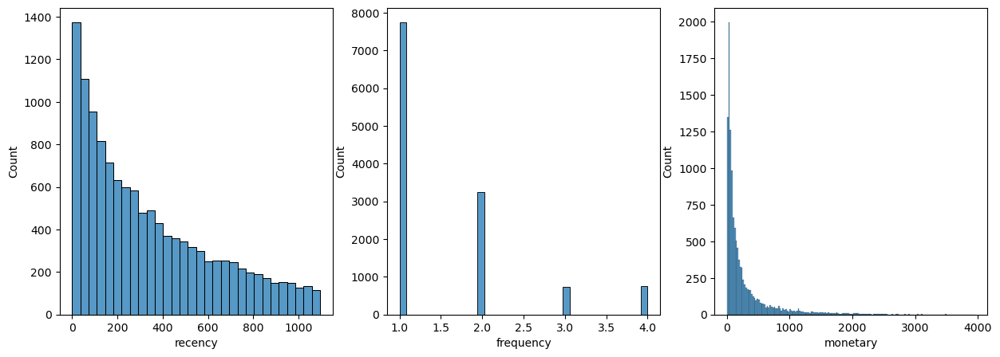

In [23]:
# The variables shouldn't be skewed and should have the same mean and variance. Let's check:
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.histplot(rfm_df, x='recency', ax=ax[0])
sns.histplot(rfm_df, x='frequency', ax=ax[1])
sns.histplot(rfm_df, x='monetary', ax=ax[2])
plt.show()

The monetary and recency variables are skewed while frequency is an ordinal variable.
- Right-skewed recency: Most customers have made recent purchases, and there is a long tail of customers who haven't made purchases for a longer time. Remember, before the customers that haven't purchased anything in 3 years were already filtered out.

- Right-skewed monetary: Most customers have lower monetary values, and there is a long tail of customers with some higher monetary values.

- Low frequency: Most customers are one time purchasers. Maximum of purchase counts is 4.

In the next step, the data will be transformed. It's checked if yeo-johnson or box-cox transformation works best to transform the variables.

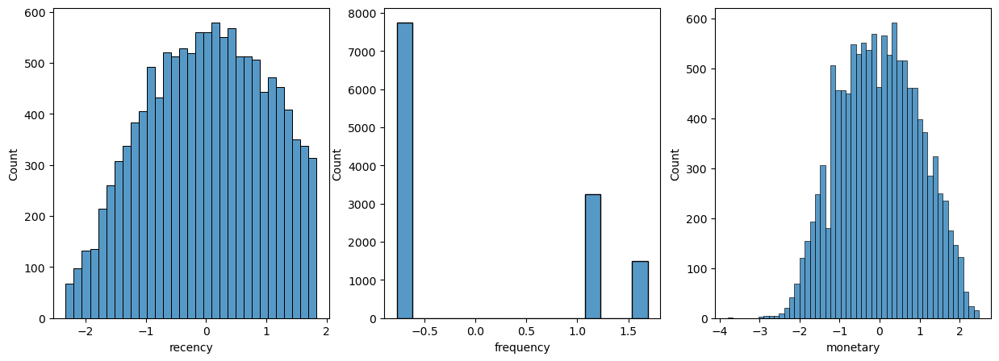

Skew of recency is:  -0.13
Skew of monetary is:  0.02


In [24]:
to_be_transformed_df = rfm_df[['recency', 'frequency', 'monetary']]

transformer = PowerTransformer(method='yeo-johnson')
transformed = transformer.fit_transform(to_be_transformed_df)

transformed_df = pd.DataFrame(transformed, columns=to_be_transformed_df.columns)

fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.histplot(transformed_df, x='recency', ax=ax[0])
sns.histplot(transformed_df, x='frequency', ax=ax[1])
sns.histplot(transformed_df, x='monetary', ax=ax[2])
plt.show()

print('Skew of recency is: ', transformed_df['recency'].skew().round(2))
print('Skew of monetary is: ', transformed_df['monetary'].skew().round(2))

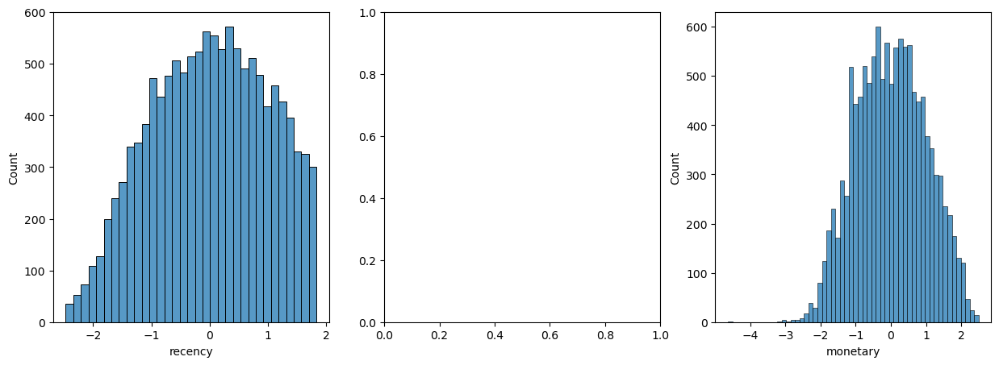

Skew of recency is:  -0.14
Skew of monetary is:  0.01


In [25]:
#to_be_scaled_df = rfm_df[['recency', 'frequency', 'monetary']]

#testing result with box-cox
to_be_transformed_df = rfm_df[['recency', 'monetary']]
transformer = PowerTransformer(method='box-cox')
transformed = transformer.fit_transform(to_be_transformed_df)
transformed_df = pd.DataFrame(transformed, columns=to_be_transformed_df.columns)

fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.histplot(transformed_df, x='recency', ax=ax[0])
#sns.histplot(transformed_df, x='frequency', ax=ax[1])
sns.histplot(transformed_df, x='monetary', ax=ax[2])
plt.show()

print('Skew of recency is: ', transformed_df['recency'].skew().round(2))
print('Skew of monetary is: ', transformed_df['monetary'].skew().round(2))

In [26]:
transformed_df.describe()

,recency,monetary
count,1.247400e+04,1.247400e+04
mean,2.195881e-16,6.117708e-16
std,1.000040e+00,1.000040e+00
min,-2.471630e+00,-4.640092e+00
25%,-7.652374e-01,-7.574793e-01
50%,3.166261e-02,-1.006309e-03
75%,7.950380e-01,7.385590e-01
max,1.835985e+00,2.500771e+00


In [27]:
transformed_df = pd.concat([rfm_df['frequency'],transformed_df[['recency', 'monetary']]], axis=1)

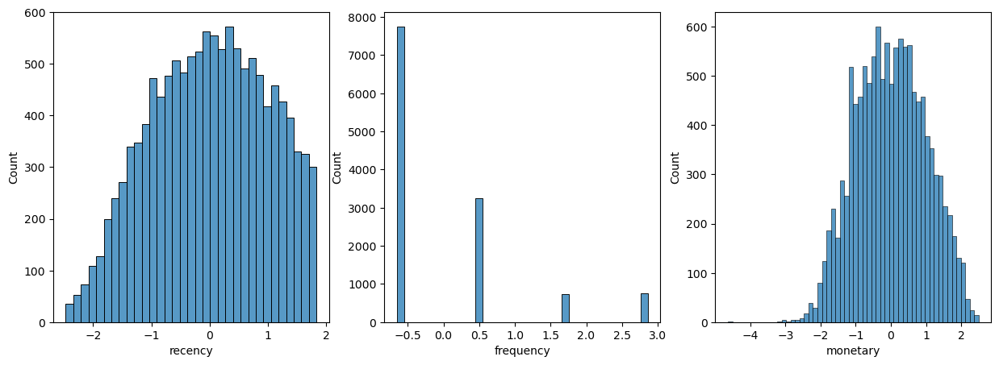

In [28]:
scaler = StandardScaler()

scaled = scaler.fit_transform(transformed_df)
scaled_df = pd.DataFrame(scaled, columns=transformed_df.columns)

fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.histplot(scaled_df, x='recency', ax=ax[0])
sns.histplot(scaled_df, x='frequency', ax=ax[1])
sns.histplot(scaled_df, x='monetary', ax=ax[2])
plt.show()


In [29]:
scaled_df.describe()

,frequency,recency,monetary
count,1.247400e+04,1.247400e+04,1.247400e+04
mean,-6.379733e-17,2.278476e-18,-3.018981e-17
std,1.000040e+00,1.000040e+00,1.000040e+00
min,-6.551413e-01,-2.471630e+00,-4.640092e+00
25%,-6.551413e-01,-7.652374e-01,-7.574793e-01
50%,-6.551413e-01,3.166261e-02,-1.006309e-03
75%,5.165049e-01,7.950380e-01,7.385590e-01
max,2.859797e+00,1.835985e+00,2.500771e+00


In [30]:
print(scaled_df.mean(axis = 0).round(2)) 
print(scaled_df.std(axis = 0).round(2)) 

frequency   -0.0
recency      0.0
monetary    -0.0
dtype: float64
frequency    1.0
recency      1.0
monetary     1.0
dtype: float64


## Applying RFM Scoring Model

In [31]:
#RFM has 4 categories in each cluster
kmeans = KMeans(n_clusters=4)
kmeans.fit(scaled_df[['recency']])
scaled_df['recency_cluster'] = kmeans.predict(scaled_df[['recency']])

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [32]:
# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(scaled_df[['recency']], scaled_df['recency_cluster'])
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.5465934878883524


In [33]:
def order_cluster(clusters: str, score: str, df: pd.DataFrame, ascending):
    """
    Takes the generated clusters, orders them and assigns them to the final cluster score.
    """
    
    # Calculate mean frequency for each cluster
    mean_frequency_per_cluster = df.groupby(clusters)[score].mean()

    # Order clusters based on mean frequency
    ordered_clusters = mean_frequency_per_cluster.sort_values(ascending=ascending).index

    # Map the original cluster labels to the ordered clusters
    df['frequency_cluster'] = df[clusters].map(dict(zip(ordered_clusters, range(len(ordered_clusters)))))

    return df[['frequency_cluster']]

In [34]:
rfm_df['recency_cluster'] = order_cluster('recency_cluster', 'recency', scaled_df, False)

/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_10114/2912497725.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm_df['recency_cluster'] = order_cluster('recency_cluster', 'recency', scaled_df, False)


In [35]:
rfm_df['recency_cluster'].value_counts()

recency_cluster
1    3739
2    3416
0    3070
3    2249
Name: count, dtype: int64

In [36]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(scaled_df[['frequency']])
scaled_df['frequency_cluster'] = kmeans.predict(scaled_df[['frequency']])

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(scaled_df[['frequency']], scaled_df['frequency_cluster'])
print(f"Silhouette Score: {silhouette_avg}")

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Silhouette Score: 1.0


In [37]:
rfm_df['frequency_cluster'] = order_cluster('frequency_cluster', 'frequency', scaled_df, True)

/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_10114/2337404798.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm_df['frequency_cluster'] = order_cluster('frequency_cluster', 'frequency', scaled_df, True)


In [38]:
rfm_df['frequency_cluster'].value_counts()

frequency_cluster
0    7746
1    3240
3     759
2     729
Name: count, dtype: int64

In [39]:
# either k=3 or k=4
kmeans = KMeans(n_clusters=4)
kmeans.fit(scaled_df[['monetary']])
scaled_df['monetary_cluster'] = kmeans.predict(scaled_df[['monetary']])
rfm_df['monetary_cluster'] = order_cluster('monetary_cluster', 'monetary', scaled_df, True)

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(scaled_df[['monetary']], scaled_df['monetary_cluster'])
print(f"Silhouette Score: {silhouette_avg}")

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_10114/797762723.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm_df['monetary_cluster'] = order_cluster('monetary_cluster', 'monetary', scaled_df, True)


Silhouette Score: 0.5381917922702304


In [40]:
rfm_df['monetary_cluster'].value_counts()

monetary_cluster
2    3814
1    3725
0    2589
3    2346
Name: count, dtype: int64

In [41]:
rfm_df.describe().T

,count,mean,std,min,25%,50%,75%,max
user_id,12474.0,50053.076800,28772.259383,18.000000,25180.000000,49708.500000,75152.000000,99999.000000
recency,12474.0,338.164522,286.883964,0.210417,96.429167,257.928819,520.771875,1094.882639
frequency,12474.0,1.559163,0.853534,1.000000,1.000000,1.000000,2.000000,4.000000
monetary,12474.0,273.035085,418.141390,0.490000,42.515000,112.980000,305.995001,3954.280006
recency_cluster,12474.0,1.388328,1.044237,0.000000,1.000000,1.000000,2.000000,3.000000
frequency_cluster,12474.0,0.559163,0.853534,0.000000,0.000000,0.000000,1.000000,3.000000
monetary_cluster,12474.0,1.474347,1.020133,0.000000,1.000000,1.000000,2.000000,3.000000


In [42]:
rfm_df.groupby('recency_cluster')['recency'].describe()

,count,mean,std,min,25%,50%,75%,max
recency_cluster,,,,,,,,
0,3070.0,764.692559,159.185244,526.666667,629.821354,740.652431,889.510243,1094.882639
1,3739.0,357.645234,87.402658,223.504861,281.309722,349.278472,429.810764,526.286806
2,3416.0,136.075598,45.643937,65.213889,95.809896,131.460417,174.369271,223.422917
3,2249.0,30.497252,18.741857,0.210417,14.244444,29.370833,45.838889,64.934028


In [43]:
rfm_df.groupby('frequency_cluster')['frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
frequency_cluster,,,,,,,,
0,7746.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
1,3240.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0
2,729.0,3.0,0.0,3.0,3.0,3.0,3.0,3.0
3,759.0,4.0,0.0,4.0,4.0,4.0,4.0,4.0


In [44]:
rfm_df.groupby('monetary_cluster')['monetary'].describe()

,count,mean,std,min,25%,50%,75%,max
monetary_cluster,,,,,,,,
0,2589.0,21.660093,8.095386,0.490000,14.990000,22.730000,28.000000,35.270000
1,3725.0,68.134967,22.380052,35.440000,49.450001,64.990000,85.800003,115.500000
2,3814.0,225.464840,82.161521,115.679998,154.985003,207.990002,285.925000,412.440001
3,2346.0,953.127034,561.497371,413.000000,542.937501,762.710007,1165.680002,3954.280006


In [45]:
#overall scoring
rfm_df['total_score'] = rfm_df['recency_cluster'] + rfm_df['frequency_cluster'] + rfm_df['monetary_cluster']
#rfm_df['total_score'] = rfm_df['recency_cluster'] + rfm_df['monetary_cluster']

/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_10114/715130164.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm_df['total_score'] = rfm_df['recency_cluster'] + rfm_df['frequency_cluster'] + rfm_df['monetary_cluster']


In [46]:
rfm_df.groupby('total_score')[['recency', 'frequency', 'monetary']].mean()
#rfm_df.groupby('total_score')[['recency', 'monetary']].mean()

,recency,frequency,monetary
total_score,,,
0,773.972428,1.000000,21.564547
1,584.045750,1.000548,45.963989
2,406.240970,1.033017,83.889190
3,291.892718,1.208935,125.838619
4,242.553969,1.497012,217.347931
5,189.472103,1.860942,357.107402
6,159.948310,2.328727,541.220386
7,156.395935,2.998358,943.791594
8,94.399121,3.649083,1199.536377


In [47]:
rfm_scores_only = rfm_df[['total_score']]
rfm_scores_only.head()

,total_score
0,1
1,4
2,3
3,6
4,2


/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Training a K-Means model with 2 clusters! 

Initialization complete
Iteration 0, inertia 36310.0.
Iteration 1, inertia 23360.009921813493.
Iteration 2, inertia 18537.603312725543.
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 19971.0.
Iteration 1, inertia 18537.603312725543.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 20222.0.
Iteration 1, inertia 19319.194577516788.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 43674.0.
Iteration 1, inertia 22230.1121618247.
Iteration 2, inertia 19319.194577516788.
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 19971.0.
Iteration 1, inertia 18537.603312725543.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 32331.0.
Iteration 1, inertia 23360.009921813493.
Iteration 2, inertia 18537.603312725543.
Converged at iteration 2: strict co

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Training a K-Means model with 4 clusters! 

Initialization complete
Iteration 0, inertia 8684.0.
Iteration 1, inertia 7043.793611353849.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 6681.0.
Iteration 1, inertia 5060.455246550468.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 9322.0.
Iteration 1, inertia 8077.532484825088.
Iteration 2, inertia 5479.272765153895.
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 6681.0.
Iteration 1, inertia 5060.455246550468.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 8679.0.
Iteration 1, inertia 6461.460488766551.
Iteration 2, inertia 4759.799666030694.
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 8684.0.
Iteration 1, inertia 6461.460488766551.
Iteration 2, inertia 4759.799666030694.
Converged at iteration 2: strict convergence.
In

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Training a K-Means model with 5 clusters! 

Initialization complete
Iteration 0, inertia 5148.0.
Iteration 1, inertia 3456.3476385304293.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 5877.0.
Iteration 1, inertia 4211.879804067574.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 5887.0.
Iteration 1, inertia 5069.728329253016.
Iteration 2, inertia 2943.2588989654955.
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 5355.0.
Iteration 1, inertia 3557.511804752465.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 5512.0.
Iteration 1, inertia 4405.557609064547.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 4444.0.
Iteration 1, inertia 3653.0510778219423.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 5148.0.
Iteration 1, inertia 2842.

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Training a K-Means model with 6 clusters! 

Initialization complete
Iteration 0, inertia 2932.0.
Iteration 1, inertia 2450.763216543708.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2629.0.
Iteration 1, inertia 1836.510310756776.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 5115.0.
Iteration 1, inertia 3395.1139694645963.
Iteration 2, inertia 2295.5134767934833.
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 4073.0.
Iteration 1, inertia 2379.9892554245885.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 3669.0.
Iteration 1, inertia 2081.8234447316236.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2629.0.
Iteration 1, inertia 1836.510310756776.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2932.0.
Iteration 1, inertia 2450

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Training a K-Means model with 7 clusters! 

Initialization complete
Iteration 0, inertia 1616.0.
Iteration 1, inertia 1076.2390227449014.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2115.0.
Iteration 1, inertia 1264.115291435212.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2149.0.
Iteration 1, inertia 1902.8433545805128.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1616.0.
Iteration 1, inertia 1076.2390227449014.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2149.0.
Iteration 1, inertia 1902.8433545805128.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2870.0.
Iteration 1, inertia 1528.0899734675152.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1616.0.
Iteration 1, inertia 1264.115291435212.
Converged at iteration 1

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 0, inertia 1616.0.
Iteration 1, inertia 1264.115291435212.
Converged at iteration 1: strict convergence.
Training a K-Means model with 8 clusters! 

Initialization complete
Iteration 0, inertia 833.0.
Iteration 1, inertia 528.3191607816797.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1219.0.
Iteration 1, inertia 695.8956195389665.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1007.0.
Iteration 1, inertia 695.8956195389665.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1237.0.
Iteration 1, inertia 720.3707768973703.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1237.0.
Iteration 1, inertia 720.3707768973703.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 833.0.
Iteration 1, inertia 716.1954294720197.
Converged at iteration 1: strict convergence.
Initializ

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Training a K-Means model with 9 clusters! 

Initialization complete
Iteration 0, inertia 224.0.
Iteration 1, inertia 147.97575757575808.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 224.0.
Iteration 1, inertia 147.97575757575808.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 224.0.
Iteration 1, inertia 147.97575757575808.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 224.0.
Iteration 1, inertia 147.97575757575808.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 224.0.
Iteration 1, inertia 147.97575757575808.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 224.0.
Iteration 1, inertia 147.97575757575808.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 436.0.
Iteration 1, inertia 147.97575757575808.
Converged at iteration 1: str

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 0, inertia 436.0.
Iteration 1, inertia 147.97575757575808.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 436.0.
Iteration 1, inertia 147.97575757575808.
Converged at iteration 1: strict convergence.


Text(0.5, 1.0, 'Silhouette Method showing the optimal k')

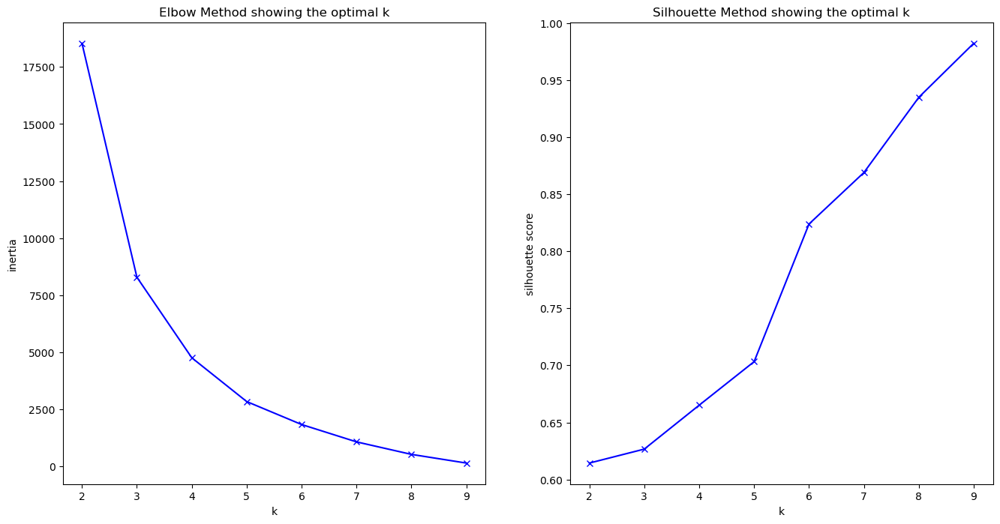

In [48]:
# We have a maximum total score of 9. Let's figure out how many clusters are optimal to segment the customers based on the scoring.
import pickle
K = range(2, 10) #max 9 clusters

inertia = []
silhouette = []

for k in K:
    print("Training a K-Means model with {} clusters! ".format(k))
    print()
    kmeans = KMeans(n_clusters=k,
                    random_state=1234,
                    verbose=1)
    kmeans.fit(rfm_scores_only)
    
    path = '../models/'
    filename = "kmeans_rfm_scores_" + str(k) + ".pickle" # Path with filename # kmeans_n.pickle
    with open(path+filename, "wb") as file:
        pickle.dump(kmeans,file)

    inertia.append(kmeans.inertia_)
    silhouette.append(silhouette_score(rfm_scores_only, kmeans.predict(rfm_scores_only)))


import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots(1,2,figsize=(16,8))
ax[0].plot(K, inertia, 'bx-')
ax[0].set_xlabel('k')
ax[0].set_ylabel('inertia')
ax[0].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[0].set_title('Elbow Method showing the optimal k')
ax[1].plot(K, silhouette, 'bx-')
ax[1].set_xlabel('k')
ax[1].set_ylabel('silhouette score')
ax[1].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[1].set_title('Silhouette Method showing the optimal k')

In [49]:
def load(filename = "filename.pickle"):
    try:
        with open(filename, "rb") as file:
            return pickle.load(file)
    except FileNotFoundError:
        print("File not found!")

In [53]:
# optimal k between 3-5. silhouette score improving as k increases
# unclear which k to choose
# appyling according to business knowledge and choosing k:
best_model_scoring = load("../models/kmeans_rfm_scores_3.pickle")

In [54]:
rfm_copy = rfm_df.copy()
rfm_copy['kmeans_total_scores_n3'] = best_model_scoring.predict(rfm_scores_only)
rfm_copy

,user_id,recency,frequency,monetary,recency_cluster,frequency_cluster,monetary_cluster,total_score,kmeans_total_scores_n3
0,18,948.572917,1,46.990002,0,0,1,1,1
1,29,31.695833,1,65.680000,3,0,1,4,0
2,49,132.884722,1,65.000000,2,0,1,3,0
3,50,94.426389,2,512.740005,2,1,3,6,2
4,51,867.986806,1,120.000000,0,0,2,2,1
...,...,...,...,...,...,...,...,...,...
12469,99951,685.563889,1,46.000000,0,0,1,1,1
12470,99962,343.352778,3,347.940004,1,2,2,5,0
12471,99982,726.484028,2,383.900002,0,1,2,3,0
12472,99997,62.479167,1,12.950000,3,0,0,3,0


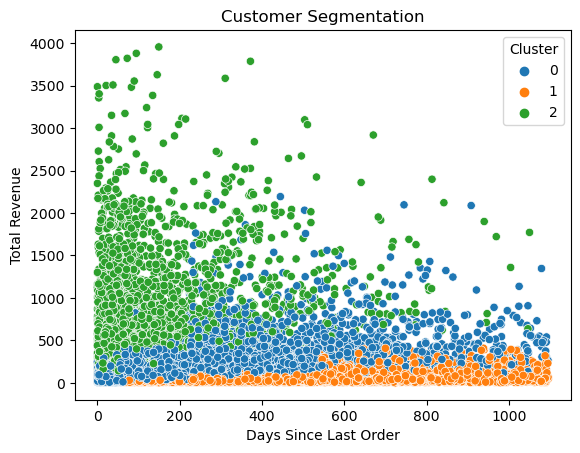

Silhouette Score: -0.006706013792067579
Calinski_harabasz Score: 2.7177233020203784


In [55]:
sns.scatterplot(x='recency', y='monetary', data=rfm_copy, hue='kmeans_total_scores_n3', palette='tab10', marker='o')
plt.xlabel('Days Since Last Order')
plt.ylabel('Total Revenue')
plt.title('Customer Segmentation')
plt.legend(title='Cluster')

plt.show()

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(rfm_copy, rfm_copy['kmeans_total_scores_n3'])
print(f"Silhouette Score: {silhouette_avg}")
calinski_harabasz = calinski_harabasz_score(rfm_copy, rfm_copy['kmeans_total_scores_n3'])
print(f"Calinski_harabasz Score: {calinski_harabasz}")

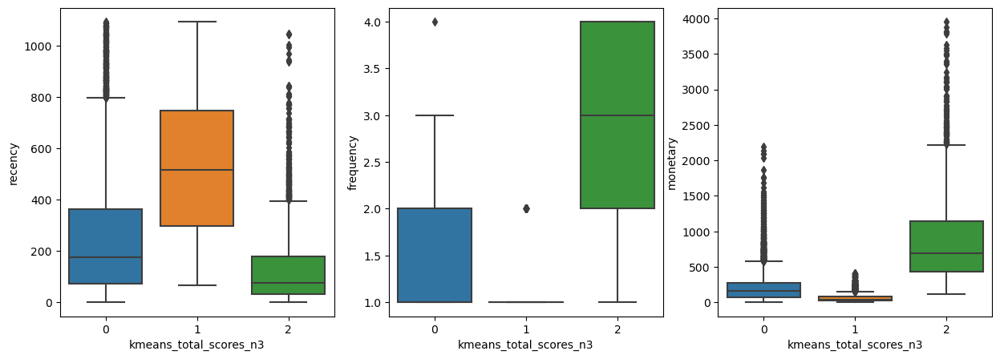

In [56]:
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.boxplot(data=rfm_copy, x='kmeans_total_scores_n3', y='recency', ax=ax[0])
sns.boxplot(data=rfm_copy, x='kmeans_total_scores_n3', y='frequency', ax=ax[1])
sns.boxplot(data=rfm_copy, x='kmeans_total_scores_n3', y='monetary', ax=ax[2])
plt.show()

- Group 0: most recent buyers (long tail though), highest frequency, highest spendings (with outliers!)
- Group 1: once in a while buyers, purchased 2 times, lowest spendings
- Group 2: more recenct buyers, purchased 1-2 times, low spendings

## Clustering customers without RFM scoring model - Applying Transforming and Scaling

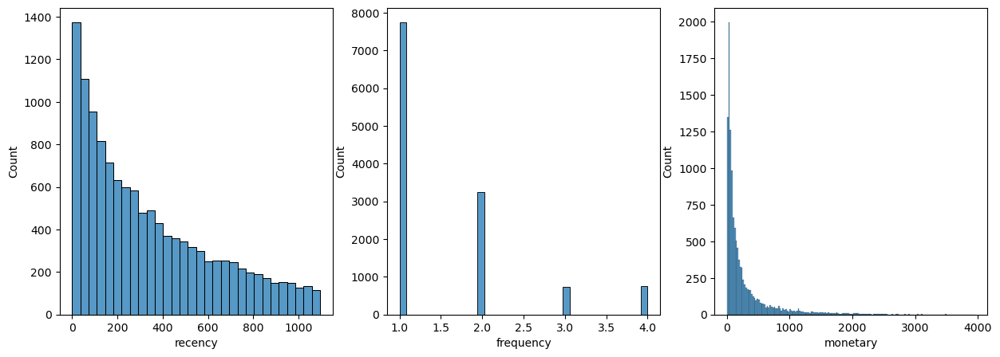

In [57]:
# only have chosen 2 features - the total_orders should have been added too
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.histplot(rfm_df, x='recency', ax=ax[0])
sns.histplot(rfm_df, x='frequency', ax=ax[1])
sns.histplot(rfm_df, x='monetary', ax=ax[2])
plt.show()

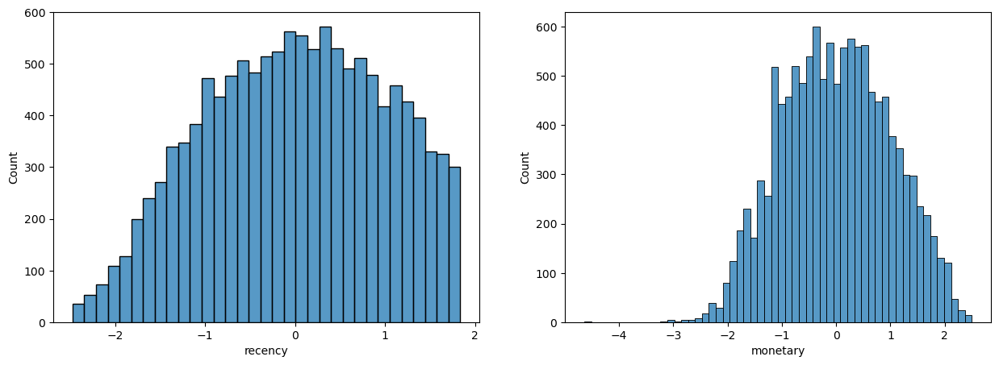

Skew of recency is:  -0.14
Skew of monetary is:  0.01


In [58]:
# Log-transform 'recency' and 'monetary'
to_be_transformed_df = rfm_df[['recency', 'monetary']]
transformer = PowerTransformer(method='box-cox')
transformed = transformer.fit_transform(to_be_transformed_df)
transformed_df = pd.DataFrame(transformed, columns=to_be_transformed_df.columns)

fig, ax = plt.subplots(1,2, figsize=(15,5))
sns.histplot(transformed_df, x='recency', ax=ax[0])
sns.histplot(transformed_df, x='monetary', ax=ax[1])
plt.show()

print('Skew of recency is: ', transformed_df['recency'].skew().round(2))
print('Skew of monetary is: ', transformed_df['monetary'].skew().round(2))


In [59]:
# add frequency again
transformed_df = pd.concat([rfm_df['frequency'],transformed_df[['recency', 'monetary']]], axis=1)

In [60]:
# next standardize all three
from sklearn.preprocessing import StandardScaler

import pickle

scaler = StandardScaler()
scaler.fit(transformed_df)
scaled = scaler.transform(transformed_df)

filename = "scaler_before_transformed.pickle"
with open(filename, "wb") as file:
    pickle.dump(scaler,file)

scaled_df = pd.DataFrame(scaled, columns = transformed_df.columns)
display(scaled_df.head())

,frequency,recency,monetary
0,-0.655141,1.613342,-0.678570
1,-0.655141,-1.389753,-0.416961
2,-0.655141,-0.535080,-0.425036
3,0.516505,-0.779417,1.109600
4,-0.655141,1.481055,0.044632


Training a K-Means model with 2 clusters! 

Initialization complete
Iteration 0, inertia 33760.09246578489.
Iteration 1, inertia 22731.720172816.
Iteration 2, inertia 21887.25504613618.
Iteration 3, inertia 21595.447467231665.
Iteration 4, inertia 21532.45603469008.
Iteration 5, inertia 21522.33501448649.
Iteration 6, inertia 21521.02304245475.
Converged at iteration 6: center shift 4.247111149627852e-05 within tolerance 0.00010000000000000202.
Initialization complete
Iteration 0, inertia 44355.55074188791.
Iteration 1, inertia 26595.532848877145.
Iteration 2, inertia 24339.171840386516.
Iteration 3, inertia 23073.962714902576.
Iteration 4, inertia 22151.29420536677.
Iteration 5, inertia 21678.3272744817.
Iteration 6, inertia 21548.55813703752.
Iteration 7, inertia 21524.519271547688.
Iteration 8, inertia 21521.13014442793.
Converged at iteration 8: center shift 4.976879533074521e-05 within tolerance 0.00010000000000000202.
Initialization complete
Iteration 0, inertia 26936.52115463282

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 3, inertia 22280.464824219292.
Iteration 4, inertia 21822.726272886786.
Iteration 5, inertia 21638.67615594014.
Iteration 6, inertia 21560.340387983346.
Iteration 7, inertia 21530.816235017097.
Iteration 8, inertia 21523.02267783229.
Iteration 9, inertia 21521.28391641047.
Converged at iteration 9: center shift 6.019455226329343e-05 within tolerance 0.00010000000000000202.
Initialization complete
Iteration 0, inertia 31686.003598171927.
Iteration 1, inertia 29171.516460068036.
Iteration 2, inertia 28089.603565172685.
Iteration 3, inertia 25777.02291972687.
Iteration 4, inertia 22757.659437602546.
Iteration 5, inertia 21631.021221897197.
Iteration 6, inertia 21532.387919018707.
Iteration 7, inertia 21522.794632724224.
Iteration 8, inertia 21521.260316878408.
Converged at iteration 8: center shift 4.326380992347038e-05 within tolerance 0.00010000000000000202.
Training a K-Means model with 3 clusters! 

Initialization complete
Iteration 0, inertia 22671.898481423726.
Iteration 1

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 15, inertia 16589.839620875042.
Iteration 16, inertia 16539.664381992276.
Iteration 17, inertia 16492.368416962854.
Iteration 18, inertia 16447.683043769393.
Iteration 19, inertia 16405.35250989131.
Iteration 20, inertia 16373.43990120722.
Iteration 21, inertia 16347.280402256925.
Iteration 22, inertia 16327.869943904836.
Iteration 23, inertia 16313.90272276303.
Iteration 24, inertia 16301.153204541257.
Iteration 25, inertia 16288.411983290844.
Iteration 26, inertia 16270.652351837402.
Iteration 27, inertia 16245.292215561421.
Iteration 28, inertia 16208.176449340026.
Iteration 29, inertia 16159.999876627226.
Iteration 30, inertia 16095.9913506374.
Iteration 31, inertia 16019.828579659144.
Iteration 32, inertia 15931.920984828183.
Iteration 33, inertia 15842.581651317712.
Iteration 34, inertia 15765.563903707116.
Iteration 35, inertia 15699.296669061492.
Iteration 36, inertia 15656.5015232541.
Iteration 37, inertia 15632.645644949329.
Iteration 38, inertia 15619.247400760614.

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Initialization complete
Iteration 0, inertia 17038.18527700942.
Iteration 1, inertia 12065.283302383916.
Iteration 2, inertia 11974.43168228957.
Iteration 3, inertia 11945.525702411907.
Iteration 4, inertia 11932.32607463283.
Iteration 5, inertia 11925.525113897584.
Iteration 6, inertia 11920.022450126547.
Iteration 7, inertia 11916.053401665926.
Iteration 8, inertia 11913.18196219598.
Iteration 9, inertia 11910.632634720103.
Iteration 10, inertia 11908.204631671259.
Iteration 11, inertia 11906.328452894753.
Iteration 12, inertia 11904.372235842144.
Iteration 13, inertia 11902.443077880189.
Iteration 14, inertia 11901.14151611529.
Iteration 15, inertia 11899.90132043447.
Iteration 16, inertia 11898.65385682772.
Iteration 17, inertia 11897.78922869941.
Converged at iteration 17: center shift 8.124871889269236e-05 within tolerance 0.00010000000000000202.
Initialization complete
Iteration 0, inertia 18401.067905752017.
Iteration 1, inertia 13043.33330936057.
Iteration 2, inertia 12203.621

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 30, inertia 9545.716918759299.
Iteration 31, inertia 9543.330043276419.
Iteration 32, inertia 9541.595224187624.
Iteration 33, inertia 9540.396182295903.
Iteration 34, inertia 9539.505340986743.
Converged at iteration 34: center shift 9.198004642735523e-05 within tolerance 0.00010000000000000202.
Initialization complete
Iteration 0, inertia 16309.783470228094.
Iteration 1, inertia 11488.686224836702.
Iteration 2, inertia 11111.703372770713.
Iteration 3, inertia 10797.51386777445.
Iteration 4, inertia 10414.425512927588.
Iteration 5, inertia 10144.72239089137.
Iteration 6, inertia 10081.879417178727.
Iteration 7, inertia 10036.023568366705.
Iteration 8, inertia 9992.575223789534.
Iteration 9, inertia 9951.687272817442.
Iteration 10, inertia 9900.709154813421.
Iteration 11, inertia 9840.65358417627.
Iteration 12, inertia 9785.401700062834.
Iteration 13, inertia 9742.64883283215.
Iteration 14, inertia 9709.344289114495.
Iteration 15, inertia 9684.406462872099.
Iteration 16, iner

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 0, inertia 11688.876008548932.
Iteration 1, inertia 8825.932891918717.
Iteration 2, inertia 8497.877894829779.
Iteration 3, inertia 8426.836318263118.
Iteration 4, inertia 8397.9918922609.
Iteration 5, inertia 8385.163120021085.
Iteration 6, inertia 8377.520068483987.
Iteration 7, inertia 8368.916501864587.
Iteration 8, inertia 8359.78896591076.
Iteration 9, inertia 8349.310324786518.
Iteration 10, inertia 8338.03755361255.
Iteration 11, inertia 8328.166358552051.
Iteration 12, inertia 8318.466620230487.
Iteration 13, inertia 8305.855625944287.
Iteration 14, inertia 8282.137334647465.
Iteration 15, inertia 8245.501929314729.
Iteration 16, inertia 8210.10633752653.
Iteration 17, inertia 8182.269362561986.
Iteration 18, inertia 8165.337541038021.
Iteration 19, inertia 8154.275756291635.
Iteration 20, inertia 8148.406558028438.
Iteration 21, inertia 8145.770313603051.
Iteration 22, inertia 8144.520713578449.
Iteration 23, inertia 8143.757889928342.
Iteration 24, inertia 8143.135

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Initialization complete
Iteration 0, inertia 12534.936450642668.
Iteration 1, inertia 8647.35013959325.
Iteration 2, inertia 7804.51195569827.
Iteration 3, inertia 7714.863577942115.
Iteration 4, inertia 7682.383053380532.
Iteration 5, inertia 7646.478631165503.
Iteration 6, inertia 7585.898652673122.
Iteration 7, inertia 7497.905962402787.
Iteration 8, inertia 7378.95122502116.
Iteration 9, inertia 7290.601751457507.
Iteration 10, inertia 7243.058043538784.
Iteration 11, inertia 7219.109809481855.
Iteration 12, inertia 7209.860388001038.
Iteration 13, inertia 7205.532857817986.
Iteration 14, inertia 7203.36083750627.
Iteration 15, inertia 7202.396899814494.
Iteration 16, inertia 7201.758540584676.
Iteration 17, inertia 7201.30641528139.
Converged at iteration 17: center shift 6.77934115893506e-05 within tolerance 0.00010000000000000202.
Initialization complete
Iteration 0, inertia 10300.617857125117.
Iteration 1, inertia 8411.907413104042.
Iteration 2, inertia 7990.167332570603.
Itera

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Initialization complete
Iteration 0, inertia 8109.8308175861275.
Iteration 1, inertia 7019.268307319217.
Iteration 2, inertia 6842.352480791693.
Iteration 3, inertia 6772.463829066943.
Iteration 4, inertia 6742.650400840559.
Iteration 5, inertia 6730.5400641883825.
Iteration 6, inertia 6723.19016262049.
Iteration 7, inertia 6718.162979604689.
Iteration 8, inertia 6716.046319753055.
Iteration 9, inertia 6714.885602739676.
Iteration 10, inertia 6713.741668030611.
Iteration 11, inertia 6712.854953946047.
Iteration 12, inertia 6712.392108783875.
Converged at iteration 12: center shift 9.528358758894659e-05 within tolerance 0.00010000000000000202.
Initialization complete
Iteration 0, inertia 8365.34319018151.
Iteration 1, inertia 6948.224457958246.
Iteration 2, inertia 6773.006063222477.
Iteration 3, inertia 6707.438512470904.
Iteration 4, inertia 6675.872446695315.
Iteration 5, inertia 6656.53983894377.
Iteration 6, inertia 6645.86664074953.
Iteration 7, inertia 6639.515972488221.
Iteratio

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 0, inertia 8400.207045785624.
Iteration 1, inertia 6801.965735442982.
Iteration 2, inertia 6489.0175148721155.
Iteration 3, inertia 6331.654126484979.
Iteration 4, inertia 6250.77869346809.
Iteration 5, inertia 6199.805642147872.
Iteration 6, inertia 6152.205317290357.
Iteration 7, inertia 6110.320883533351.
Iteration 8, inertia 6082.902371752818.
Iteration 9, inertia 6064.975743071947.
Iteration 10, inertia 6052.955156047187.
Iteration 11, inertia 6044.747439558513.
Iteration 12, inertia 6039.210195779326.
Iteration 13, inertia 6034.803595568564.
Iteration 14, inertia 6031.412708612077.
Iteration 15, inertia 6028.552547867812.
Iteration 16, inertia 6026.306747241602.
Iteration 17, inertia 6024.649141374861.
Iteration 18, inertia 6023.181291323153.
Iteration 19, inertia 6022.022609570622.
Iteration 20, inertia 6020.928583571053.
Iteration 21, inertia 6020.0728786108175.
Iteration 22, inertia 6019.120986789709.
Iteration 23, inertia 6018.492474913149.
Iteration 24, inertia 601

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 0, inertia 7197.955068754331.
Iteration 1, inertia 6094.481401919428.
Iteration 2, inertia 5836.564840036472.
Iteration 3, inertia 5709.4790141947215.
Iteration 4, inertia 5615.267002536077.
Iteration 5, inertia 5521.234729274187.
Iteration 6, inertia 5436.009654074698.
Iteration 7, inertia 5388.58259276906.
Iteration 8, inertia 5366.85100970971.
Iteration 9, inertia 5355.763582143401.
Iteration 10, inertia 5349.9295343529375.
Iteration 11, inertia 5346.679011023436.
Iteration 12, inertia 5344.744762573482.
Iteration 13, inertia 5342.934055314811.
Iteration 14, inertia 5341.557906196896.
Iteration 15, inertia 5340.491874543863.
Iteration 16, inertia 5339.994023740399.
Iteration 17, inertia 5339.692255144715.
Converged at iteration 17: center shift 8.285580234457749e-05 within tolerance 0.00010000000000000202.
Initialization complete
Iteration 0, inertia 7988.585170554435.
Iteration 1, inertia 5766.835319072032.
Iteration 2, inertia 5535.058832114022.
Iteration 3, inertia 5440

Iteration 12, inertia 5766.312322174935.
Iteration 13, inertia 5760.875883036691.
Iteration 14, inertia 5754.999946811689.
Iteration 15, inertia 5750.507336896158.
Iteration 16, inertia 5746.939961045153.
Iteration 17, inertia 5743.186269037238.
Iteration 18, inertia 5739.486096056216.
Iteration 19, inertia 5734.263910053152.
Iteration 20, inertia 5728.559270784603.
Iteration 21, inertia 5723.824897632269.
Iteration 22, inertia 5720.843404448664.
Iteration 23, inertia 5717.998743732526.
Iteration 24, inertia 5714.877989067325.
Iteration 25, inertia 5711.820466607878.
Iteration 26, inertia 5710.62155847233.
Iteration 27, inertia 5709.393230211667.
Iteration 28, inertia 5708.128996925823.
Iteration 29, inertia 5707.065488245529.
Iteration 30, inertia 5706.3805033465815.
Iteration 31, inertia 5705.319312482756.
Iteration 32, inertia 5703.742152394154.
Iteration 33, inertia 5701.474365777149.
Iteration 34, inertia 5697.981246213922.
Iteration 35, inertia 5694.283619663565.
Iteration 36, in

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Iteration 45, inertia 4992.421695747709.
Iteration 46, inertia 4991.89155469893.
Iteration 47, inertia 4991.359308675712.
Iteration 48, inertia 4990.914507502384.
Iteration 49, inertia 4990.532714311951.
Iteration 50, inertia 4990.065524274825.
Iteration 51, inertia 4989.621650512074.
Iteration 52, inertia 4989.216426987586.
Iteration 53, inertia 4988.8488662484215.
Iteration 54, inertia 4988.341194606608.
Iteration 55, inertia 4988.094743341903.
Converged at iteration 55: center shift 3.518762721987378e-05 within tolerance 0.00010000000000000202.
Initialization complete
Iteration 0, inertia 6123.947349003315.
Iteration 1, inertia 5522.895614235593.
Iteration 2, inertia 5407.914805762345.
Iteration 3, inertia 5350.956760108279.
Iteration 4, inertia 5324.038043126047.
Iteration 5, inertia 5310.291320986249.
Iteration 6, inertia 5300.362371000294.
Iteration 7, inertia 5293.394681410815.
Iteration 8, inertia 5285.980362496323.
Iteration 9, inertia 5279.820778619695.
Iteration 10, inertia 

Initialization complete
Iteration 0, inertia 6839.476268837254.
Iteration 1, inertia 5581.066518503883.
Iteration 2, inertia 5393.153795891022.
Iteration 3, inertia 5296.174976741746.
Iteration 4, inertia 5236.445424819088.
Iteration 5, inertia 5201.612261830467.
Iteration 6, inertia 5180.445798904824.
Iteration 7, inertia 5167.508750927731.
Iteration 8, inertia 5159.393925798739.
Iteration 9, inertia 5154.593625020838.
Iteration 10, inertia 5151.583226685212.
Iteration 11, inertia 5149.690088817537.
Iteration 12, inertia 5148.001690619034.
Iteration 13, inertia 5146.639227098058.
Iteration 14, inertia 5145.784783955365.
Iteration 15, inertia 5145.069483442281.
Iteration 16, inertia 5144.136153595445.
Iteration 17, inertia 5143.43946571939.
Iteration 18, inertia 5142.768982900247.
Iteration 19, inertia 5141.872336940687.
Iteration 20, inertia 5141.231100534758.
Iteration 21, inertia 5140.646377043429.
Iteration 22, inertia 5139.987913776676.
Iteration 23, inertia 5139.242198893554.
Ite

Text(0.5, 1.0, 'Silhouette Method showing the optimal k')

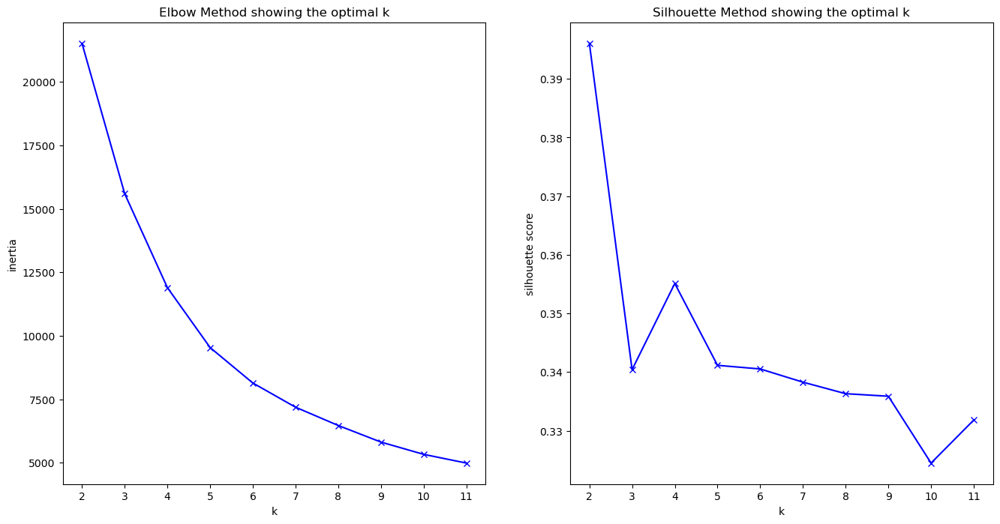

In [61]:
from sklearn.metrics import silhouette_score
K = range(2, 12)

inertia = []
silhouette = []

for k in K:
    print("Training a K-Means model with {} clusters! ".format(k))
    print()
    kmeans = KMeans(n_clusters=k,
                    random_state=1234,
                    verbose=1)
    kmeans.fit(scaled_df)
    
    path = '../models/'
    filename = "kmeans_w_transf_" + str(k) + ".pickle" # Path with filename # kmeans_n.pickle
    with open(path+filename, "wb") as file:
        pickle.dump(kmeans,file)

    inertia.append(kmeans.inertia_)
    silhouette.append(silhouette_score(scaled_df, kmeans.predict(scaled_df)))


import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots(1,2,figsize=(16,8))
ax[0].plot(K, inertia, 'bx-')
ax[0].set_xlabel('k')
ax[0].set_ylabel('inertia')
ax[0].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[0].set_title('Elbow Method showing the optimal k')
ax[1].plot(K, silhouette, 'bx-')
ax[1].set_xlabel('k')
ax[1].set_ylabel('silhouette score')
ax[1].set_xticks(np.arange(min(K), max(K)+1, 1.0))
ax[1].set_title('Silhouette Method showing the optimal k')

In [62]:
# elbow suggests something between 3-5
# silhouette shows only peak at k=2 and once going up at k=4

In [63]:
def load(filename = "filename.pickle"):
    try:
        with open(filename, "rb") as file:
            return pickle.load(file)
    except FileNotFoundError:
        print("File not found!")

In [64]:
best_model = load("../models/kmeans_w_transf_3.pickle")

In [65]:
scaled_copy = scaled_df.copy()
scaled_copy['kmeans_3_cluster'] = best_model.predict(scaled_df)

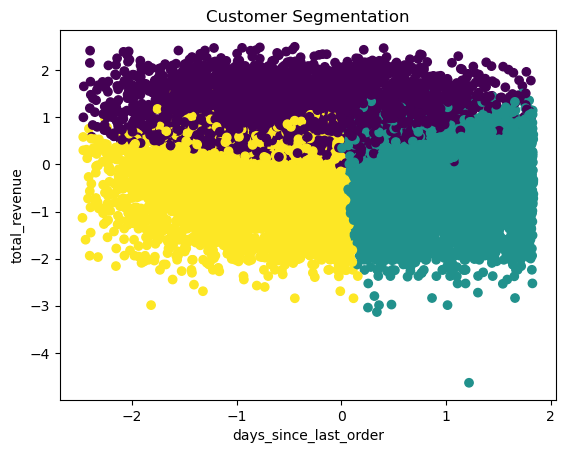

In [66]:
from sklearn.metrics import silhouette_score

# Visualize the clusters (replace 'feature1' and 'feature2' with your actual features)
plt.scatter(scaled_copy['recency'], scaled_copy['monetary'], c=scaled_copy['kmeans_3_cluster'], cmap='viridis')
plt.xlabel('days_since_last_order')
plt.ylabel('total_revenue')
plt.title('Customer Segmentation')
plt.show()

In [67]:
df['kmeans_cluster_n3'] = scaled_copy['kmeans_3_cluster']

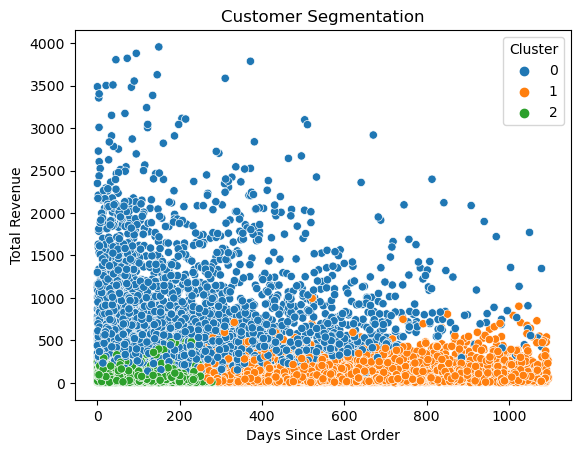

Silhouette Score: 0.43818176132814757
Calinski_harabasz Score: 11734.550838223684


In [68]:
sns.scatterplot(x='days_since_last_order', y='total_revenue', data=df, hue='kmeans_cluster_n3', palette='tab10', marker='o')
plt.xlabel('Days Since Last Order')
plt.ylabel('Total Revenue')
plt.title('Customer Segmentation')
plt.legend(title='Cluster')

plt.show()

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(scaled_copy, scaled_copy['kmeans_3_cluster'])
print(f"Silhouette Score: {silhouette_avg}")
calinski_harabasz = calinski_harabasz_score(scaled_copy, scaled_copy['kmeans_3_cluster'])
print(f"Calinski_harabasz Score: {calinski_harabasz}")

In [69]:
df['kmeans_cluster_n3'] = df['kmeans_cluster_n3'].astype(str)

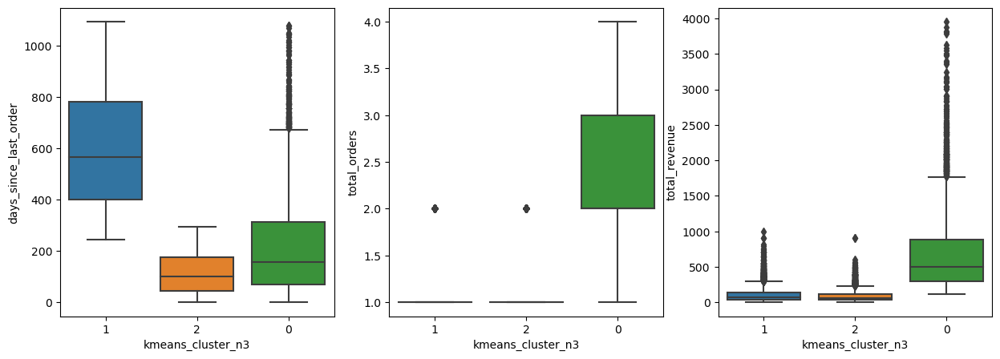

In [70]:
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.boxplot(data=df, x='kmeans_cluster_n3', y='days_since_last_order', ax=ax[0])
sns.boxplot(data=df, x='kmeans_cluster_n3', y='total_orders', ax=ax[1])
sns.boxplot(data=df, x='kmeans_cluster_n3', y='total_revenue', ax=ax[2])
plt.show()

- Group 0: most recent buyers, recurring customer, low spendings
- Group 1: bought within last year (long tail though), recurring customer up to 4 times, spend the most
- Group 2: unfrequent buyers, recurring customer, low spendings

## Clustering customers without RFM scoring model - Applying only Scaling

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_10114/677002574.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X2["cluster_kmean"]  = kmeans.predict(X_scaled_df2)


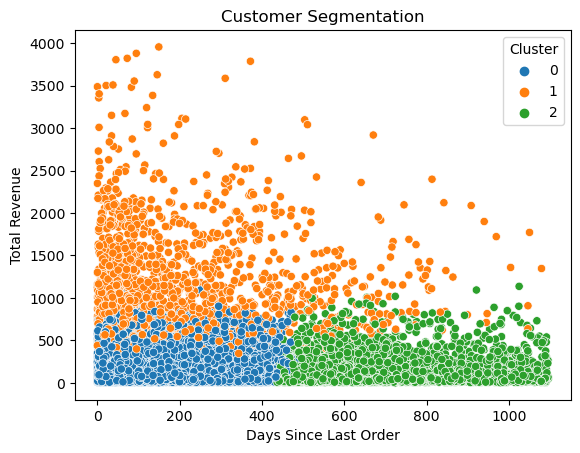

Silhouette Score: 0.4571811765556452
Calinski_harabasz Score: 11983.433885967785


In [72]:
X2 = df[['days_since_last_order', 'total_orders', 'total_revenue']]

scaler2 = StandardScaler()
scaler2.fit(X2)
X_scaled2 = scaler2.transform(X2)

filename = "scaler_before_not_transf.pickle" # Path with filename

with open(filename, "wb") as file:
    pickle.dump(scaler2,file)

X_scaled_df2 = pd.DataFrame(X_scaled2, columns = X2.columns)


kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_scaled_df2)
X2["cluster_kmean"]  = kmeans.predict(X_scaled_df2)

# Visualize the clusters (replace 'feature1' and 'feature2' with your actual features)
sns.scatterplot(x='days_since_last_order', y='total_revenue', data=X2, hue='cluster_kmean', palette='tab10', marker='o')
plt.xlabel('Days Since Last Order')
plt.ylabel('Total Revenue')
plt.title('Customer Segmentation')
plt.legend(title='Cluster')

plt.show()

# Evaluate the clustering using silhouette score
silhouette_avg = silhouette_score(X_scaled_df2, clusters2)
print(f"Silhouette Score: {silhouette_avg}")
calinski_harabasz = calinski_harabasz_score(X_scaled_df2, clusters2)
print(f"Calinski_harabasz Score: {calinski_harabasz}")

#### Silhouette Score:

Measures how similar an object is to its own cluster (cohesion) compared to other clusters (separation).
Value ranges from -1 to 1. A higher silhouette score indicates better-defined clusters.

Inertia (within-cluster sum of squares):

Measures how far the points within a cluster are from the centroid.
Lower inertia values are generally better, indicating tighter and more compact clusters.

#### Calinski-Harabasz Index (Variance Ratio Criterion):
Measures the ratio of the between-cluster variance to the within-cluster variance. Higher values indicate better-defined clusters.

Calinski-Harabasz score of 13302.86 is relatively high, indicating that the clusters in your KMeans model are well-separated. This is a positive result, suggesting that the chosen number of clusters and the resulting clustering configuration are effective in distinguishing between different groups in your data.

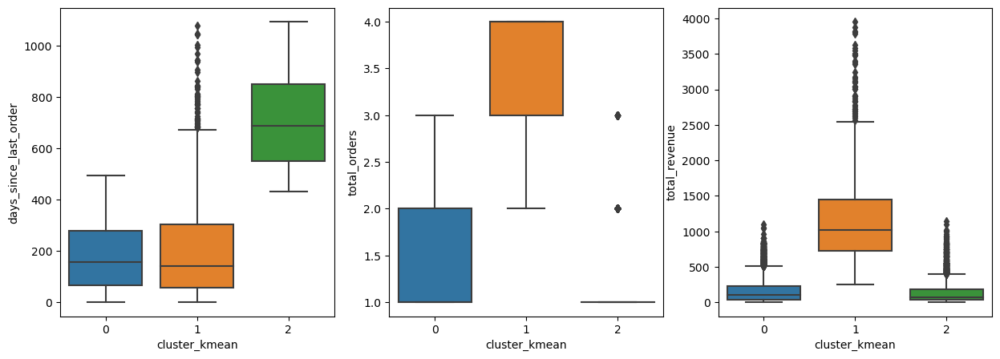

In [73]:
fig, ax = plt.subplots(1,3, figsize=(15,5))
sns.boxplot(data=X2, x='cluster_kmean', y='days_since_last_order', ax=ax[0])
sns.boxplot(data=X2, x='cluster_kmean', y='total_orders', ax=ax[1])
sns.boxplot(data=X2, x='cluster_kmean', y='total_revenue', ax=ax[2])
plt.show()

- Group 0: purchased in last year, recurring customer, low spendings
- Group 1: purchased in last year(long tail), frequent customers, middle spendings
- Group 2: hasn't purchased within last year, one time purchasers, low spendings

## DBSCAN for Clustering

/var/folders/xv/sbmlp5m11vlc8qbxx5xp1lfw0000gp/T/ipykernel_10114/3424976696.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['dbscan_cluster'] = dbscan.labels_


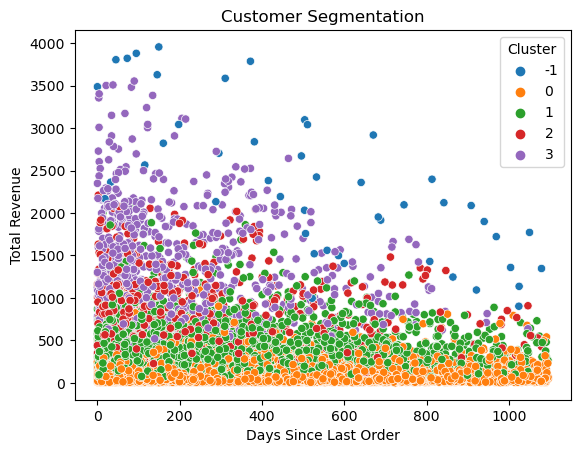

In [74]:
# Import library and create instance of model
from sklearn.cluster import DBSCAN

X = df[['days_since_last_order', 'total_orders', 'total_revenue']]
scaler = StandardScaler()
scaler.fit(X)
X_scaled_np = scaler.transform(X)
X_scaled_df = pd.DataFrame(X_scaled_np, columns=X.columns)

dbscan = DBSCAN(eps=0.5, min_samples=6)

# Fit the DBSCAN model to our data by calling the `fit` method
dbscan.fit_predict(X_scaled_df)

# Access the clusters allocate it to df
X['dbscan_cluster'] = dbscan.labels_

# Visualize the clusters
sns.scatterplot(x='days_since_last_order', y='total_revenue', data=X, hue='dbscan_cluster', palette='tab10', marker='o')
plt.xlabel('Days Since Last Order')
plt.ylabel('Total Revenue')
plt.title('Customer Segmentation')
plt.legend(title='Cluster')

plt.show()

In [75]:
from sklearn.neighbors import NearestNeighbors
import plotly.express as px

neighbors = 6 # The value of MinPoints or mins_samples = 2 * number_of_columns
# X_embedded is your data
nbrs = NearestNeighbors(n_neighbors=neighbors).fit(X_scaled_df)
distances, indices = nbrs.kneighbors(X_scaled_df)
print("The 'distances' array is an 2D-array containing as many rows as points and as many columns as mins_samples", distances.shape)
distance_desc = sorted(distances[:,neighbors-1], reverse=True)
fig = px.line(x=list(range(1,len(distance_desc )+1)),y= distance_desc).update_layout(
    xaxis_title="Array index", yaxis_title="Distance"
)
fig.add_hline(y=0.5, annotation_text="Default value of epsilon in DBSCAN") #0.5 is always the default epsilon
fig.show()

The 'distances' array is an 2D-array containing as many rows as points and as many columns as mins_samples (12474, 6)


In [76]:
(min(distance_desc),max(distance_desc))

(0.0029497622778506148, 1.6340620272412092)

In [77]:
from kneed import KneeLocator
kneedle = KneeLocator(range(1,len(distance_desc)+1),  #x values
                      distance_desc, # y values
                      S=1.0, #parameter suggested from paper
                      curve="convex", #parameter from figure (see https://mmerevise.co.uk/a-level-maths-revision/convex-and-concave-curves/)
                      direction="decreasing") #parameter from figure
print("The epsilon value for which the distance plot has the biggest change in the slope is: {:.2f}".format(kneedle.knee_y))

The epsilon value for which the distance plot has the biggest change in the slope is: 0.46


/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



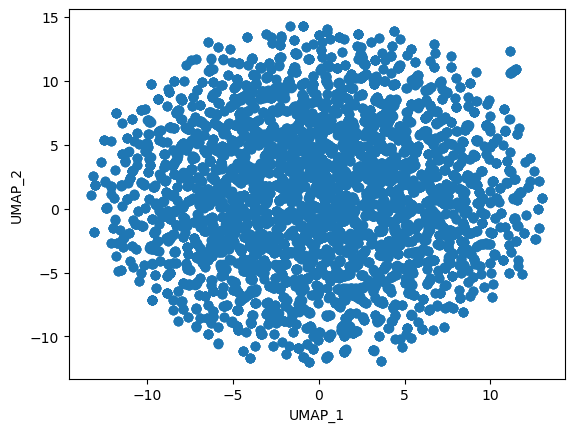

In [78]:
from umap import UMAP

X = df[['days_since_last_order', 'total_orders', 'total_revenue']]
reducer = UMAP(n_neighbors=3, n_components=2,random_state=42)
reducer.fit(X)

X_umap_transformed = reducer.transform(X)
X_umap_transformed_df = pd.DataFrame(X_umap_transformed, columns=["UMAP_1","UMAP_2"])

fig, ax = plt.subplots()
ax.scatter(X_umap_transformed_df['UMAP_1'],X_umap_transformed_df['UMAP_2'])
ax.set_xlabel("UMAP_1")
ax.set_ylabel("UMAP_2")
plt.show()

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/alinaaufenanger/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



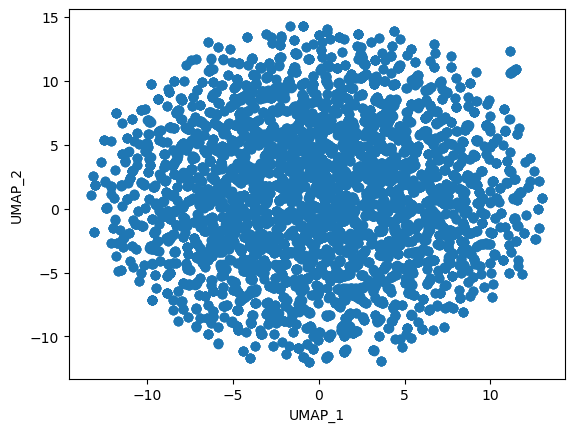

In [79]:
from umap import UMAP

X = df[['days_since_last_order', 'total_orders', 'total_revenue']]
reducer = UMAP(n_neighbors=3, n_components=2,random_state=42)
reducer.fit(X)

X_umap_transformed = reducer.transform(X)
X_umap_transformed_df = pd.DataFrame(X_umap_transformed, columns=["UMAP_1","UMAP_2"])

fig, ax = plt.subplots()
ax.scatter(X_umap_transformed_df['UMAP_1'],X_umap_transformed_df['UMAP_2'])
ax.set_xlabel("UMAP_1")
ax.set_ylabel("UMAP_2")
plt.show()

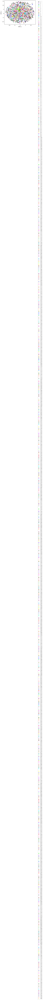

In [80]:
import colorcet as cc

dbscan = DBSCAN(eps=0.2)

# Fit the DBSCAN model to our data by calling the `fit` method
yhat = dbscan.fit_predict(X_umap_transformed_df)

# Access the clusters allocate it to df
X_umap_transformed_df['dbscan_cluster'] = yhat

# retrieve unique clusters
cluster_dbscan = np.unique(yhat)

# Visualize the clusters
# Creating a pallette of hihg contrast colors with as many color as cluster labels
custom_palette = sns.color_palette(cc.glasbey, n_colors=cluster_dbscan.size)
# Modifiying the palette to set the color "black=(0.,0.,0.)" to the label "-1" #(R,G,B)
custom_palette = [color if cluster_dbscan != -1 else (0.,0.,0.) for cluster_dbscan, color in zip(cluster_dbscan,custom_palette)]
sns.scatterplot(X_umap_transformed_df, x="UMAP_1", y="UMAP_2", hue="dbscan_cluster", palette=custom_palette)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left');
plt.show()

In [81]:
print("The Silhouette score of the model is: ",round(silhouette_score(X_umap_transformed_df, dbscan.fit_predict(X_umap_transformed_df)),2))
print("The Calinksi-Harabasz score of the model is: ",round(calinski_harabasz_score(X_umap_transformed_df, dbscan.fit_predict(X_umap_transformed_df)),2))

The Silhouette score of the model is:  0.85
The Calinksi-Harabasz score of the model is:  4856.93


In [100]:
df['kmeans_cluster_wo_transf'] = X2["cluster_kmean"]
df.rename(columns={'kmeans_cluster_n3': 'kmeans_cluster_w_transf'}, inplace=True)
#df['kmeans_cluster_w_transf'] = scaled_copy["kmeans_3_cluster"] 
df['kmeans_rfm_score_based'] = rfm_copy['kmeans_total_scores_n3']

## Comparing all Segmentation Models in 3D

In [90]:
df['kmeans_cluster_w_transf'] = df['kmeans_cluster_w_transf'].astype('int32')

In [91]:
fig = px.scatter_3d(df, x='days_since_last_order', y='total_revenue', 
                    z='total_orders',color='kmeans_cluster_wo_transf')
fig.show()

In [92]:
fig = px.scatter_3d(df, x='days_since_last_order', y='total_revenue', 
                    z='total_orders',color='kmeans_cluster_w_transf')
fig.show()

In [93]:
fig = px.scatter_3d(df, x='days_since_last_order', y='total_revenue', 
                    z='total_orders',color='kmeans_rfm_score_based')
fig.show()

## Summary

The segmenation model that doesn't transform the data works best. 
RFM scoring can be skipped as only applying the K-means to the variables equivalent to RFM is sufficient.
The segmentation result is not perfect but gives a first insight.

I suggest to iterate through other options:
- leaving out the factor frequency as the max amount is only 4
- group frequency to 0, 1 for one-time-purchasers & more frequent purchasers
- include days_since_registration as tenure and include it in the model
- try clustering with other variables and not only RFM features

In [101]:
df.head()

,user_id,registration_date,age,gender,city,country,first_order_date,last_order_date,total_orders,avg_order_items,...,order_frequency_per_year,days_since_first_order,days_since_last_order,days_since_registration,days_until_first_order,age_class,registration_year,registration_month,kmeans_cluster_wo_transf,kmeans_rfm_score_based
0,18,2020-06-18 10:15:00+00:00,31,M,Schwedt/Oder,Poland,2021-05-26 10:15:00+00:00,2021-05-26 10:15:00+00:00,1,1.0,...,3.922828e-16,948.572917,948.572917,1290.572917,342.0,31-40,2020,6,2,1
1,29,2023-09-22 07:18:00+00:00,23,M,Pudsey,United Kingdom,2023-11-29 07:18:00+00:00,2023-11-29 07:18:00+00:00,1,2.0,...,1.173999e-14,31.695833,31.695833,99.695833,68.0,19-30,2023,9,0,0
2,49,2023-04-11 02:46:00+00:00,62,M,Bailleul,France,2023-08-20 02:46:00+00:00,2023-08-20 02:46:00+00:00,1,1.0,...,2.800238e-15,132.884722,132.884722,263.884722,131.0,61-70,2023,4,0,0
3,50,2023-05-01 13:46:00+00:00,15,F,Linares,Spain,2023-07-10 13:46:00+00:00,2023-09-27 13:46:00+00:00,2,1.5,...,4.291260e-15,173.426389,94.426389,243.426389,70.0,0-18,2023,5,0,2
4,51,2019-07-11 00:19:00+00:00,66,M,Siegen,Germany,2021-08-15 00:19:00+00:00,2021-08-15 00:19:00+00:00,1,1.0,...,4.287034e-16,867.986806,867.986806,1633.986806,766.0,61-70,2019,7,2,1


In [102]:
df.to_csv('../data/cleaned/customer_information_with_segments.csv', index=False)

##### functions

In [96]:
def customer_clusters(df: pd.DataFrame, recency= 'recency', frequency= 'frequency', monetary= 'monetary', k= 3):
    """
    Input data frame with RFM-alike columns that will be used for clustering.
    Function scales variables and performs a KMeans Clustering with k=3 default.
    Returns df with appended Kmeans Clusters.
    """

    X = df[[recency, frequency, monetary]]

    scaler = StandardScaler()
    scaler.fit(X)
    X_scaled = scaler.transform(X)
    
    #filename = "scaler.pickle" # Path with filename

    #with open(filename, "wb") as file:
    #        pickle.dump(scaler,file)

    X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)


    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled_df)
    clusters = kmeans.predict(X_scaled_df)

    X["cluster_kmean"] = clusters

    return X